In [1]:
# example of horizontal shift image augmentation
import glob
from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot as plt


RAW_IMAGE_DIR = '../data/raw_data/images/'
PROCESSED_IMAGE_SAVE_DIR = '../data/processed_data/'
PROCESSED_IMAGE_FORMAT = 'jpeg'
NUM_OF_IMAGES = 24 # multiple of 6 


Using TensorFlow backend.
/Users/mohitrajput/Documents/VirtualEnvironments/MyPersonalEnv/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/Users/mohitrajput/Documents/VirtualEnvironments/MyPersonalEnv/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/Users/mohitrajput/Documents/VirtualEnvironments/MyPersonalEnv/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) /

## Prepare Iterator
    datagen = ImageDataGenerator(
        rotation_range=90, #0,
        width_shift_range= 0.2,#[-150,150],# default=0.0,
        height_shift_range= 0.2, #0.0,
        zoom_range= [1.0,2.0], #0.0,
        horizontal_flip= True,#False,
        vertical_flip= True, #False,
        brightness_range=None,
        shear_range=0.0,
        fill_mode='nearest',
    #     featurewise_center=False,
    #     samplewise_center=False,
    #     featurewise_std_normalization=False,
    #     samplewise_std_normalization=False,
    #     zca_whitening=False,
    #     zca_epsilon=1e-06,
    #     channel_shift_range=0.0,
    #     cval=0.0,
    #     rescale=None,
    #     preprocessing_function=None,
    #     data_format='channels_last',
    #     validation_split=0.0,
    #     interpolation_order=1,
    #     dtype='float32',
    )


    ## rotation_range : amount of rotation
    # example of random rotation image augmentation: rotation_range=90
    ## width_shift_range , height_shift_range : amount of shift in width, height
    # create image data augmentation generator : width_shift_range=[-200,200]
    # example of vertical shift image augmentation: height_shift_range=0.5
    ## horizontal_flip : Boolean (True or False). Randomly flip inputs horizontally
    # example of horizontal flip image augmentation: horizontal_flip=True
    ## zoom_range : range for random zoom
    # example of zoom image augmentation: zoom_range=[0.5,1.0]
    ##
    # example of brighting image augmentation: brightness_range=[0.2,1.0]
    # shear_range : shear angle in counter-clockwise direction as radians
    # fill_mode : One of {“constant”, “nearest”, “reflect” or “wrap”}. Points outside the boundaries of the input are filled according to the given mode


Working with the image 1/7
Working with the image 2/7
Working with the image 3/7
Working with the image 4/7
Working with the image 5/7
Working with the image 6/7
Working with the image 7/7


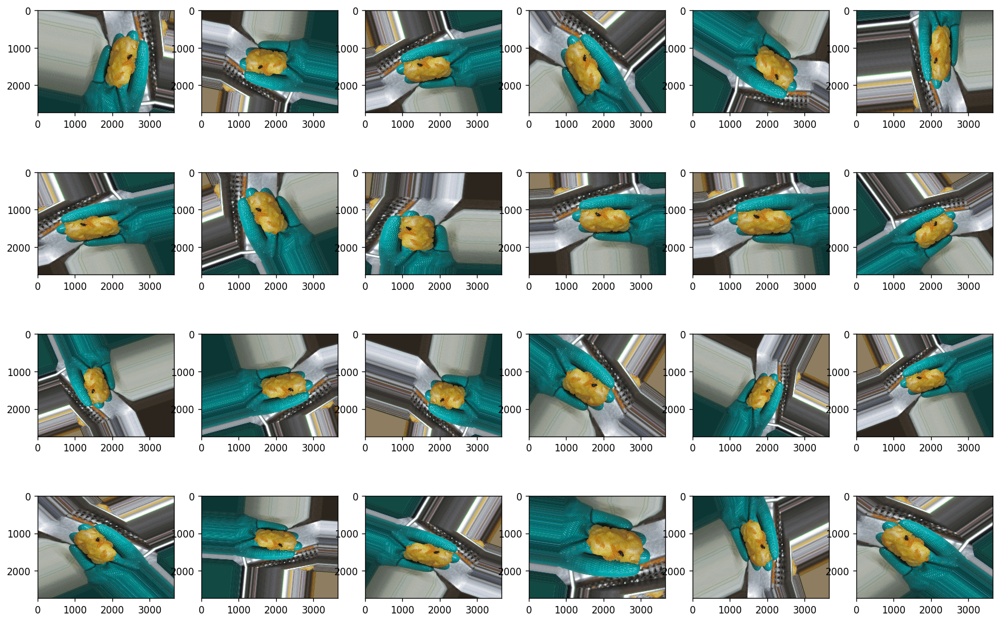

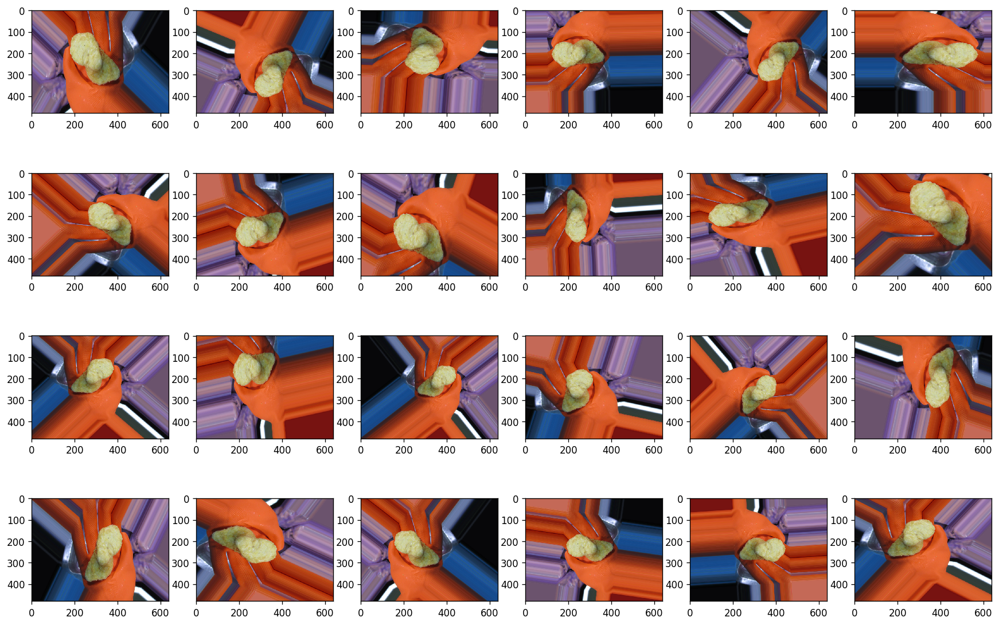

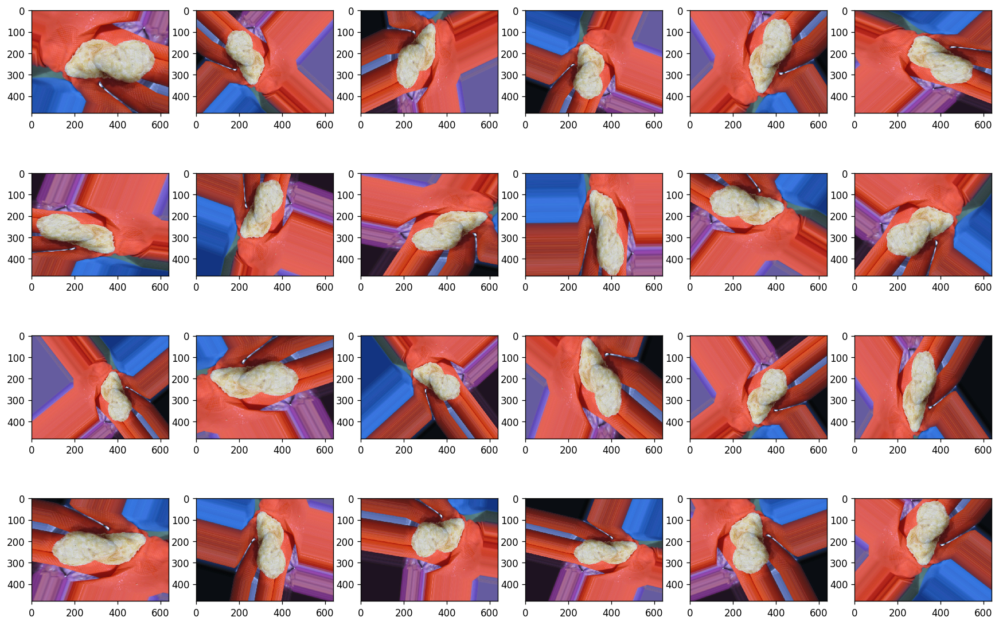

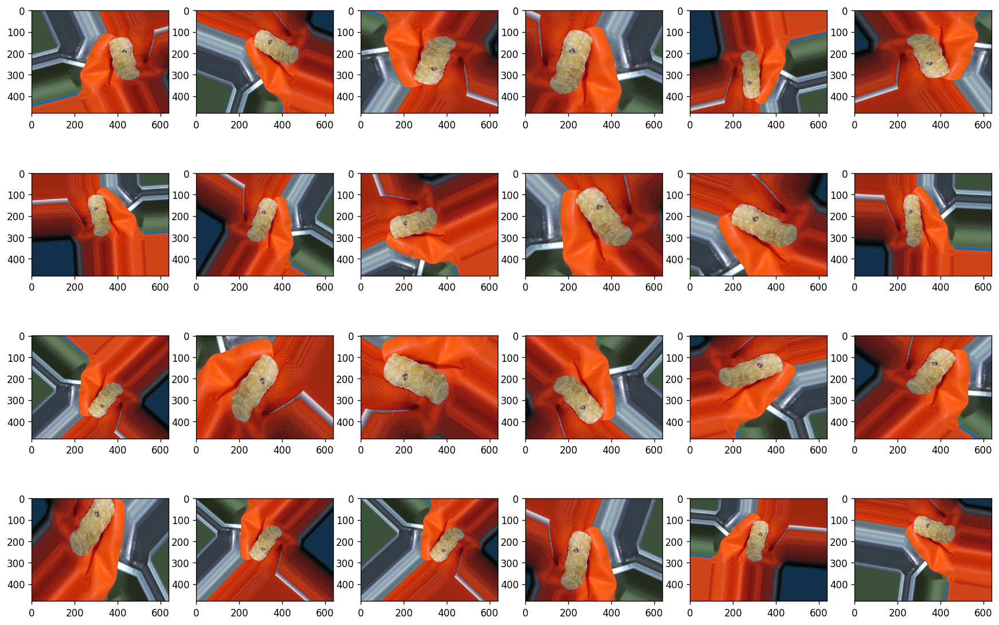

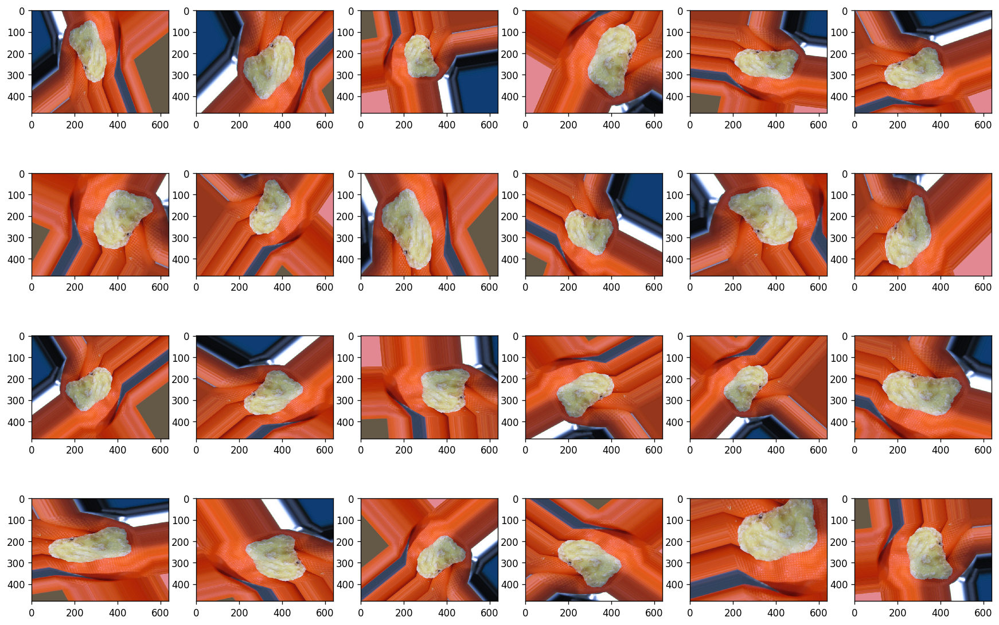

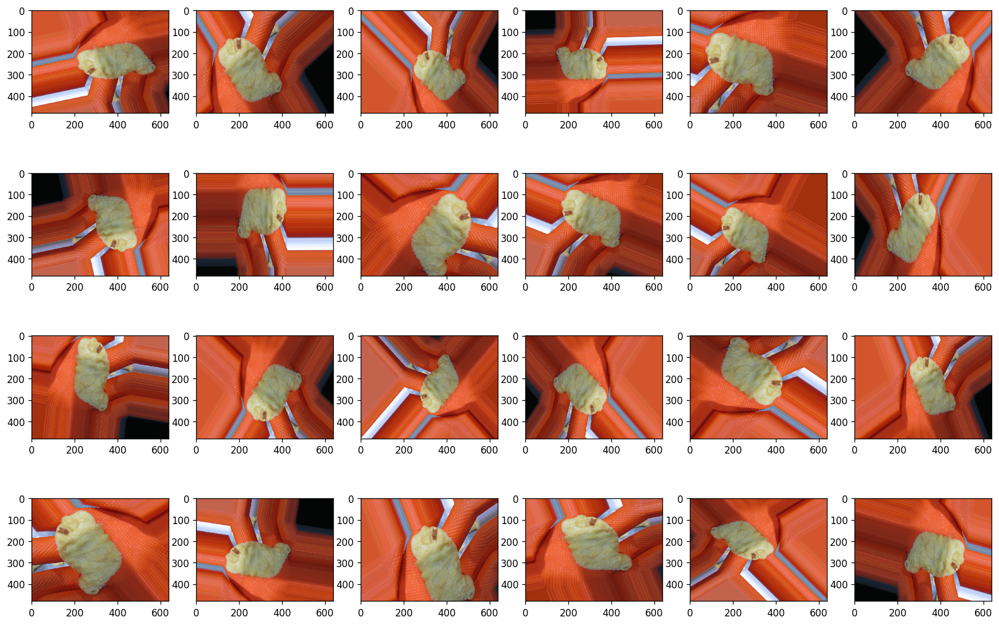

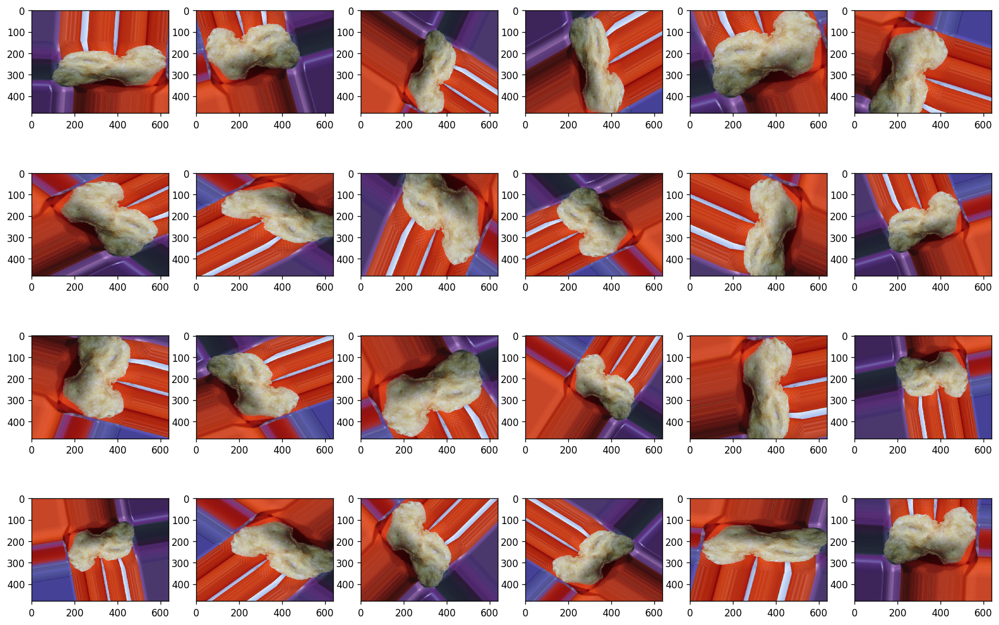

In [2]:

def plot(datagen, IMAGE_PATH, new_image_name_prefix, msg = False):
    ''' '''
    ## load the image into PIL format
    img = load_img(
        path=IMAGE_PATH,
        grayscale=False,
        color_mode='rgb',
        target_size=None,
        interpolation='nearest',
    )
    # type(img) # PIL.JpegImagePlugin.JpegImageFile

    ## convert to numpy array with shape (x, y, 3)
    img_arr = img_to_array(img, data_format=None, dtype=None)
    if msg: print('Image Shape :', img_arr.shape)

    ## converting to a Numpy array with shape (1, 3, 150, 150) , expand dimension to one sample
    img_rarr = img_arr.reshape((1,) + img_arr.shape)
    # img_rarr = expand_dims(img_arr, 0)
    if msg: print('Image Shape after reshaping:', img_rarr.shape)

    # if msg: print('ImageDataGenerator Initialized')
    it = datagen.flow(
        img_rarr,
        y=None,
        batch_size=1, #32,
        shuffle=True,
        sample_weight=None,
        seed=None,
        save_to_dir= PROCESSED_IMAGE_SAVE_DIR, # None,
        save_prefix= new_image_name_prefix, # '',
        save_format= PROCESSED_IMAGE_FORMAT, # 'png',
        subset=None,
    )
    if msg: print('NumpyArrayIterator Initialized')

    # generate samples and plot
    n_row = int(NUM_OF_IMAGES/6)
    plt.figure(num=None, figsize=(18, n_row*3), dpi=120, facecolor='w', edgecolor='k')
    for i in range(NUM_OF_IMAGES):
        # define subplot
        plt.subplot(n_row, 6, i+1)
        # generate batch of images
        batch = it.next()
        # convert to unsigned integers for viewing
        image = batch[0].astype('uint8')
        # plot raw pixel data
        plt.imshow(image)
#     plt.show()
    if msg: print('Images Saved at location', PROCESSED_IMAGE_SAVE_DIR)


files = glob.glob(RAW_IMAGE_DIR+'*')
image_paths = [ f for f in files if f.split('.')[-1].lower() in ['jpg', 'jpeg', 'png'] ]
for i in range(len(image_paths)):
    print('Working with the image {}'.format(str(i+1)+'/'+str(len(image_paths))))
    ## Prepare Iterator
    datagen = ImageDataGenerator(
        rotation_range=90, #0,
        width_shift_range= 0.2,#[-150,150],# default=0.0,
        height_shift_range= 0.2, #0.0,
        zoom_range= [1.0,2.0], #0.0,
        horizontal_flip= True,#False,
        vertical_flip= True, #False,
        brightness_range=None,
        shear_range=0.0,
        fill_mode='nearest',
    )
    
    new_image_name_prefix = image_paths[i].split('/')[-1].split('.')[0]
    plot(datagen, image_paths[i], new_image_name_prefix, msg = False)


In [ ]:
import numpy as np

var = np.array([[1,2,3,4,5,6], [1,2,3,4,5,6]])
print(var.ndim)
print(var.shape)

var = np.array([
    [
        [1,2,3,4,5,6], 
        [21,31,41,51,61,71]
    ],
    [
        [0,1,3,4,5,6], 
        [3,2,3,4,5,6]
    ],
    [
        [9,2,3,4,5,6], 
        [12,2,3,4,5,6]
    ]
])
print(var.ndim)
print(var.shape)
print(var)
print('-'*100)
print(var[0][0][0], var[0][0][1], var[0][0][2])
print(var[0][0][0], var[0][1][0], var[0][1][1])
print(var[0][0][0], var[0][1][0], var[0][1][11])
